# Tutorial 7: MOSTA integration
This tutorial primarily describes the process of using samples E11.5_E1S1 and E11.5_E1S3 to impute E11.5_E1S2.

## Environment Configuration & Package Loading

In [1]:
import os
import torch
import scanpy as sc
from GenOT import genot
import warnings
warnings.filterwarnings("ignore")
# Run device, by default, the package is implemented on 'cpu'. We recommend using GPU.
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
# the location of R, which is necessary for mclust algorithm. Please replace the path below with local R installation path
os.environ['R_HOME'] = 'C:/Program Files/R/R-4.4.1'
os.environ['PATH'] = 'C:/Program Files/R/R-4.4.1/bin/x64;' + os.environ['PATH']

C:\ProgramData\anaconda3\envs\pytorch\lib\site-packages\scipy\__init__.py:177: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Data Loading

In [2]:
adata1 = sc.read_h5ad(r'..\Data\E11.5_E1S1.MOSTA.h5ad')
adata1 = sc.pp.subsample(adata1, n_obs=5000, random_state=0, copy=True)
adata2 = sc.read_h5ad(r'..\Data\E11.5_E1S3.MOSTA.h5ad')
adata2 = sc.pp.subsample(adata2, n_obs=5000, random_state=0, copy=True)
adata3 = sc.read_h5ad(r'..\Data\E11.5_E1S2.MOSTA.h5ad')
adata3 = sc.pp.subsample(adata3, n_obs=5000, random_state=0, copy=True)

## normalize

In [3]:
from GenOT.utils import normalize_sparse

adata1 = normalize_sparse(adata1)
adata2 = normalize_sparse(adata2)
adata3 = normalize_sparse(adata3)

## Visualize adata1, adata2, and adata3.

[<AxesSubplot: title={'center': 'barycenter'}, xlabel='spatial1', ylabel='spatial2'>]

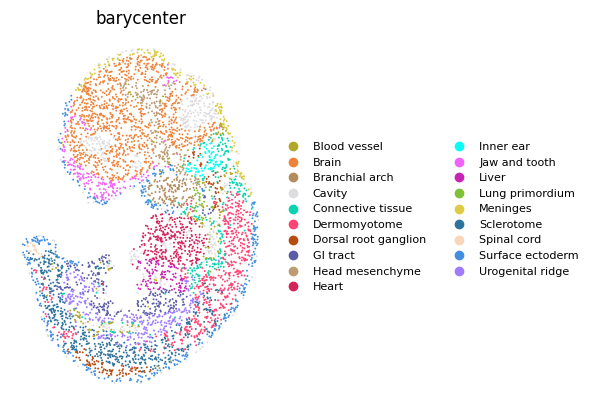

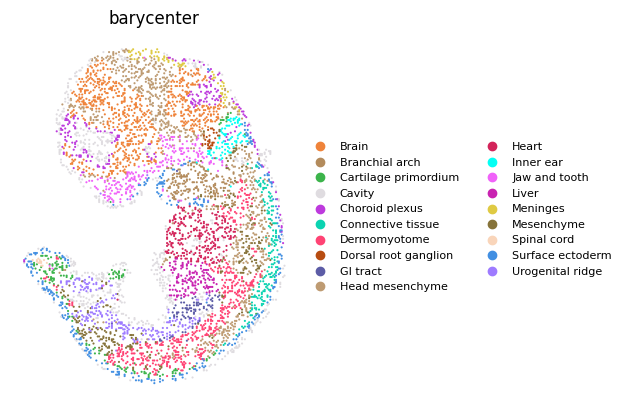

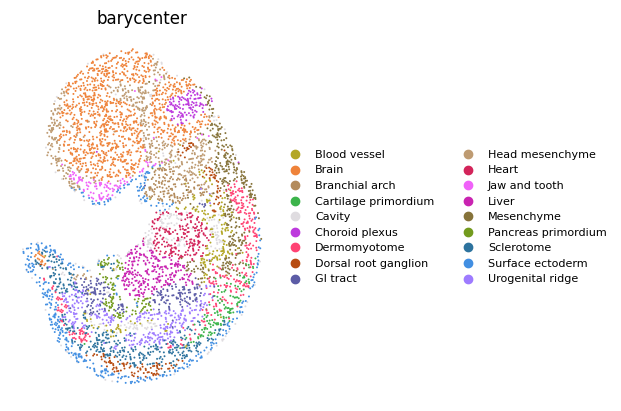

In [4]:
sc.pl.spatial(adata1, img_key=None, color='annotation', title='barycenter', size=1.5, legend_fontsize=8,
              show=False, frameon=False, spot_size=1)
sc.pl.spatial(adata2, img_key=None, color='annotation', title='barycenter', size=1.5, legend_fontsize=8,
              show=False, frameon=False, spot_size=1)
sc.pl.spatial(adata3, img_key=None, color='annotation', title='barycenter', size=1.5, legend_fontsize=8,
              show=False, frameon=False, spot_size=1)

## Align the input datasets adata1 and adata2 using the GenOT algorithm.

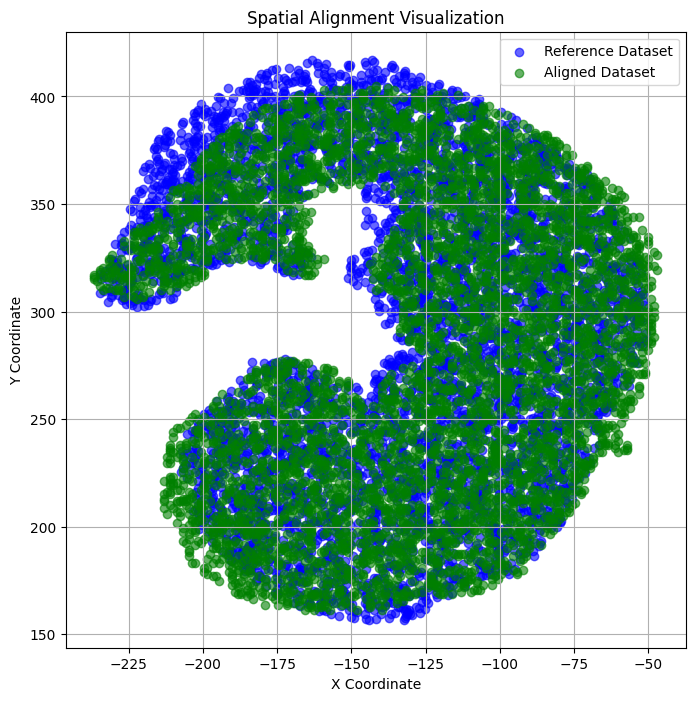

In [5]:
from GenOT.utils import align_spatial_coords
from GenOT.plotting import visualize_alignment
adata2.obsm['spatial']=align_spatial_coords(adata1.obsm['spatial'], adata2.obsm['spatial'],area_ratio_threshold=1)
visualize_alignment(adata1.obsm['spatial'], adata2.obsm['spatial'])

Get unique marker genes from adata3 based on its annotations.
These marker genes will be used to ensure consistent gene sets across all datasets.

In [6]:

from GenOT.utils import get_unique_marker_genes


unique_marker_genes = get_unique_marker_genes(adata3, annotation_column_name='annotation', n_top_genes= 10)



Using annotation column 'annotation' for marker gene analysis...
Unique values in annotation column: ['Brain', 'Head mesenchyme', 'Cavity', 'Sclerotome', 'Dorsal root ganglion', 'Mesenchyme', 'Dermomyotome', 'Urogenital ridge', 'Heart', 'Branchial arch', 'Blood vessel', 'Surface ectoderm', 'Liver', 'GI tract', 'Choroid plexus', 'Jaw and tooth', 'Pancreas primordium', 'Cartilage primordium']
Extracted 114 unique marker genes from the top 10 genes per annotation group.
First 10 extracted marker genes: ['Acta2', 'Actc1', 'Afp', 'Amot', 'Apex2', 'Apoa2', 'Apoe', 'Asxl3', 'Atp2a2', 'Bc1']...


## Data Preprocessing

In [7]:
common_genes = set(unique_marker_genes) & set(adata1.var_names) & set(adata2.var_names) & set(adata3.var_names)
matching_genes = list(common_genes)

adata1 = adata1[:, matching_genes].copy()
adata2 = adata2[:, matching_genes].copy()
adata3 = adata3[:, matching_genes].copy()

## Run GenOT

In [8]:
# define model
Encoder = genot.DualEncoder(adata1,adata2, device=device, pca_n=16)


In [9]:
adata1,adata2  = Encoder.train_encoder()


Training DualEncoder on 2 datasets with 700 epochs...


Training: 100%|██████████| 700/700 [00:21<00:00, 31.89it/s]


Training completed!


 Compute the spatial barycenter

In [10]:
from GenOT.OTutils import compute_spatial_barycenter, compute_emb_barycenter

Xb_s,s_transport_plans=compute_spatial_barycenter(adata1,adata2, weight1=0.5,num_barycenters=adata3.n_obs)

It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|6.121426e+04|0.000000e+00|0.000000e+00
    1|6.106914e+04|2.376419e-03|1.451259e+02
    2|6.106905e+04|1.395421e-06|8.521707e-02
It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|5.810448e+04|0.000000e+00|0.000000e+00
    1|5.796061e+04|2.482145e-03|1.438666e+02
    2|5.796061e+04|0.000000e+00|0.000000e+00
It.  |Err         
-------------------
    0|5.612321e+05|
    0|2.304730e+04|
It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|9.203229e+03|0.000000e+00|0.000000e+00
    1|8.424181e+01|1.082478e+02|9.118987e+03
    2|3.998680e+01|1.106741e+00|4.425501e+01
    3|3.998680e+01|0.000000e+00|0.000000e+00
It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|9.070789e+03|0.000000e+00|0.000000e+00
    1|8.017388e+01|1.121390e+02|8.990616e+

In [11]:
decoder = genot.Decoder(
    input_size=adata1.obsm['emb'].shape[1],  # Input dimension
    output_size=adata1.X.shape[1],  # Output dimension
)
# Train the decoder
trained_decoder = decoder.train_decoder(adata1, adata2, decoder, epochs=500, batch_size=2048)

100%|██████████| 500/500 [01:04<00:00,  7.75it/s]


In [12]:
embd0 = adata1.obsm['emb']
embd1 = adata2.obsm['emb']

## Compute the embedding barycenter for the latent representations.

In [13]:
Xb,e_transport_plans = compute_emb_barycenter(adata1, adata2, weight1=0.5, num_barycenters=adata3.n_obs)

It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|1.425957e+02|0.000000e+00|0.000000e+00
    1|1.338667e+02|6.520663e-02|8.728996e+00
    2|1.338618e+02|3.666998e-05|4.908709e-03
    3|1.338618e+02|0.000000e+00|0.000000e+00
It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|6.418874e+01|0.000000e+00|0.000000e+00
    1|5.432863e+01|1.814901e-01|9.860108e+00
    2|5.432863e+01|0.000000e+00|0.000000e+00
It.  |Err         
-------------------
    0|7.157228e+03|
    0|9.267090e+02|
It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|2.161672e+01|0.000000e+00|0.000000e+00
    1|7.224797e+00|1.992018e+00|1.439192e+01
    2|7.224797e+00|0.000000e+00|0.000000e+00
It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|2.453813e+01|0.000000e+00|0.000000e+00
    1|7.535333e+00|2.256410e+00|1.700280e+

Since the spatial barycenter and embedding barycenter reside in different spaces (not one-to-one cell correspondences), we align them by constraining the embedding barycenter. Refer to the [update_embedding_barycenter] function for details.

In [14]:

from GenOT.OTutils import update_embedding_barycenter

Xb = update_embedding_barycenter(Xb_s, Xb, s_transport_plans, e_transport_plans)


 Use the trained decoder to transform the embedding barycenter into gene expression values.

In [15]:
new_embedding = torch.tensor(Xb, dtype=torch.float32)
new_embedding = new_embedding.to("cuda" if torch.cuda.is_available() else "cpu")

trained_decoder.eval()
with torch.no_grad():
    reconstructed_features = trained_decoder(new_embedding)

reconstructed_gene_expression = reconstructed_features.cpu().numpy()

print("Reconstructed Features Shape:", reconstructed_gene_expression.shape)


Reconstructed Features Shape: (5000, 114)


Create a new adata object where the gene expression matrix equals the generated expression values, and spatial coordinates match the spatial barycenter.

In [16]:
new_adata = adata3.copy()
X=reconstructed_gene_expression.copy()
thresholds = X.max(axis=0) /3
for i, threshold in enumerate(thresholds):
        X[:, i][X[:, i] < threshold] = 0
new_adata.X = X
new_adata.obsm['spatial'] = Xb_s

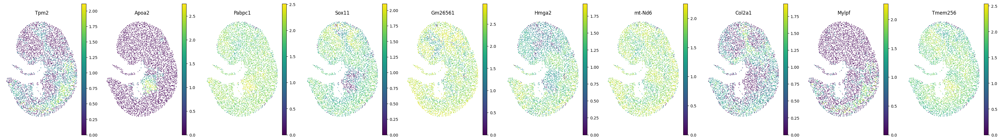

In [17]:
import matplotlib.pyplot as plt
import scanpy as sc


genes_of_interest = list(common_genes)[:10]

fig, axes = plt.subplots(1, 10, figsize=(35, 5))
plt.subplots_adjust(wspace=0.3)

for i, gene in enumerate(genes_of_interest):
    sc.pl.spatial(
        new_adata,
        color=gene,
        ax=axes[i],
        title=gene,
        show=False,
        size=1.5,
        spot_size=1,
        cmap='viridis',
        frameon=False
    )

plt.tight_layout()
plt.show()




Map the generated gene expression data to the target dataset using the [create_mapped_adata] function.

In [18]:
from GenOT.OTutils import create_mapped_adata


mapped_adata = create_mapped_adata(new_adata, adata3,threshold_denominator=3)



 Visualize the mapped data, original datasets (adata1 and adata2), and the imputed dataset (adata3)

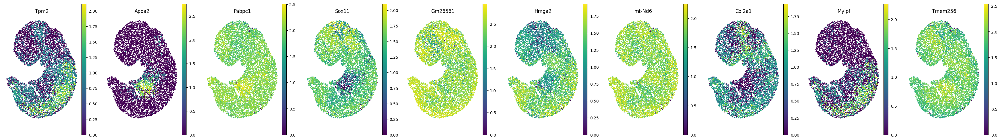

In [19]:
import matplotlib.pyplot as plt
import scanpy as sc


genes_of_interest = list(common_genes)[:10]

fig, axes = plt.subplots(1, 10, figsize=(35, 5))
plt.subplots_adjust(wspace=0.3)

for i, gene in enumerate(genes_of_interest):
    sc.pl.spatial(
        mapped_adata,
        color=gene,
        ax=axes[i],
        title=gene,
        show=False,
        size=1.5,
        spot_size=2,
        cmap='viridis',
        frameon=False
    )

plt.tight_layout()
plt.show()




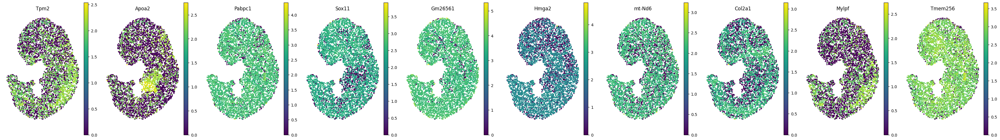

In [20]:

genes_of_interest = list(common_genes)[:10]

fig, axes = plt.subplots(1, 10, figsize=(35, 5))
plt.subplots_adjust(wspace=0.3)

for i, gene in enumerate(genes_of_interest):
    sc.pl.spatial(
        adata1,
        color=gene,
        ax=axes[i],
        title=gene,
        show=False,
        size=1.5,
        spot_size=2,
        cmap='viridis',
        frameon=False
    )

plt.tight_layout()
plt.show()

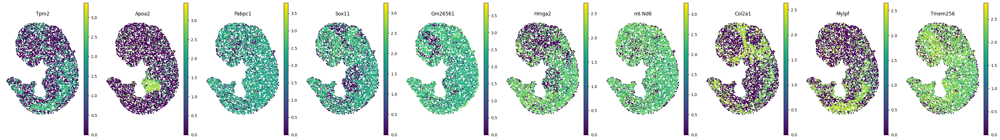

In [21]:

genes_of_interest = list(common_genes)[:10]

fig, axes = plt.subplots(1, 10, figsize=(35, 5))
plt.subplots_adjust(wspace=0.3)

for i, gene in enumerate(genes_of_interest):
    sc.pl.spatial(
        adata2,
        color=gene,
        ax=axes[i],
        show=False,
        size=1.5,
        spot_size=2,
        cmap='viridis',
        frameon=False
    )

plt.tight_layout()
plt.show()

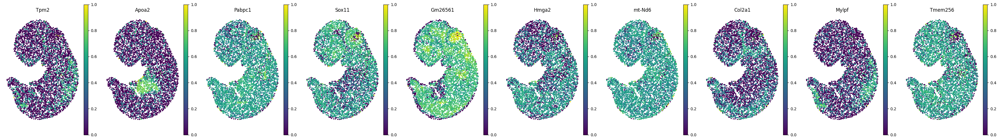

In [22]:
common_genes = adata1.var_names
genes_of_interest = list(common_genes)[:10]


fig, axes = plt.subplots(1, 10, figsize=(35, 5))
plt.subplots_adjust(wspace=0.3)

for i, gene in enumerate(genes_of_interest):
    sc.pl.spatial(
        adata3,
        color=gene,
        ax=axes[i],
        title=gene,
        show=False,
        size=1.5,
        spot_size=2,
        cmap='viridis',
        frameon=False
    )

plt.tight_layout()
plt.show()

## Visualize the Myl7 gene expression across datasets.

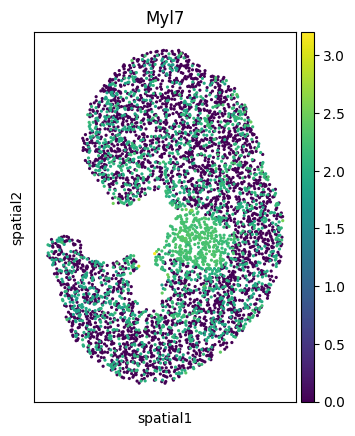

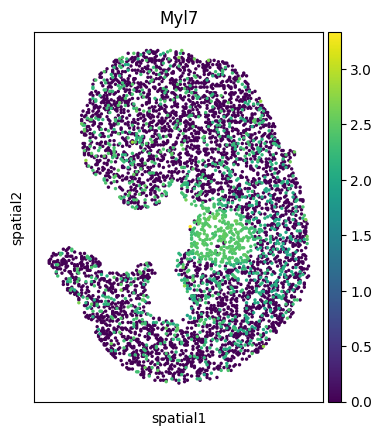

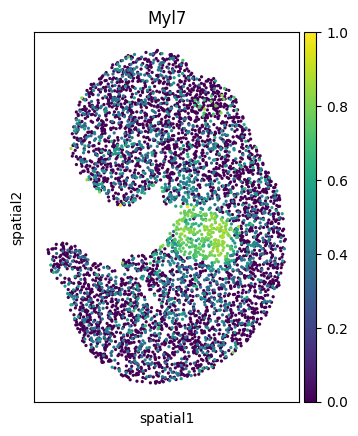

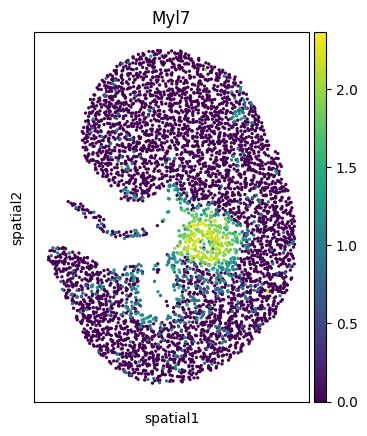

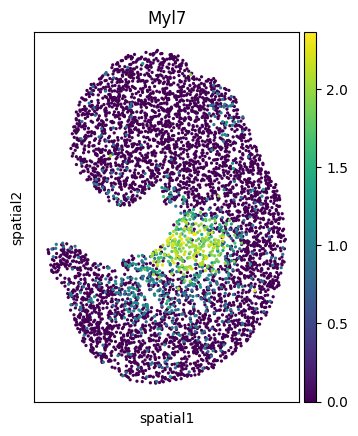

In [23]:
sc.pl.spatial(adata1, img_key=None, color='Myl7', cmap='viridis', size=2.5, spot_size=1)
sc.pl.spatial(adata2, img_key=None, color='Myl7', cmap='viridis', size=2.5, spot_size=1)
sc.pl.spatial(adata3, img_key=None, color='Myl7', cmap='viridis', size=2.5, spot_size=1)
sc.pl.spatial(new_adata, img_key=None, color='Myl7', cmap='viridis', size=2.5, spot_size=1)
sc.pl.spatial(mapped_adata ,img_key=None, color='Myl7', cmap='viridis', size=2.5, spot_size=1)

Starting comparison for 114 common genes...


Calculating gene SSIM scores: 100%|██████████| 114/114 [03:32<00:00,  1.86s/it]


Analysis complete! Processed 114 genes
Mean SSIM: 0.8894 ± 0.0145
Median SSIM: 0.8859



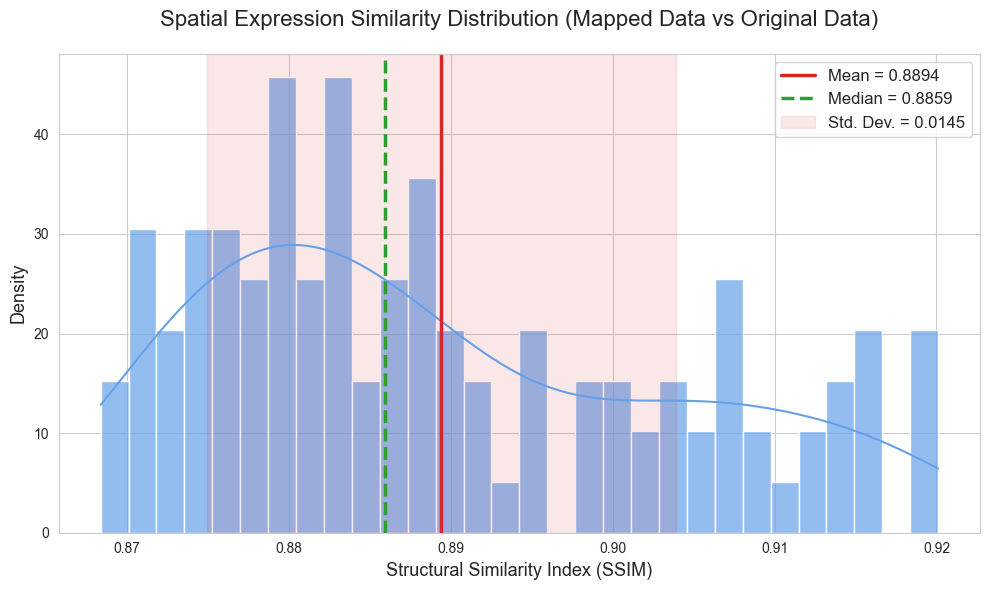

In [24]:

from GenOT.plotting import compare_spatial_expression_all_genes
# Compare the spatial expression patterns between the mapped (imputed) data and the original target data.
# This function calculates and plots similarity metrics (e.g., SSIM) for all genes.
mean_ssim, scores_df = compare_spatial_expression_all_genes(
    adata1=mapped_adata,
    adata1_name="Mapped Data",
    adata2=adata3,
    adata2_name="Original Data",
    max_genes=None,
    output_csv=None,
    plot_file=None,
    figsize=(10, 6)
)


--- Starting gene embedding metric calculation ---
Original adata shape: (5000, 114)
Original mapped_adata shape: (5000, 114)
Transposed adata_g1 shape (genes x cells): (114, 5000)
Transposed adata_g2 shape (genes x cells): (114, 5000)
Found 114 common genes for analysis.
adata_g1 shape after common gene filtering: (114, 5000)
adata_g2 shape after common gene filtering: (114, 5000)

Performing PCA (16 dimensions) for both datasets...
Gene embedding dimensions for Dataset 1: (114, 16)
Gene embedding dimensions for Dataset 2: (114, 16)

Calculating similarity metrics: PCC, Cosine Similarity, RMSE, JS Divergence...

--- Metric calculation complete ---

--- Generating distribution plots for similarity metrics ---
Average PCC: 0.5715
Average Cosine Similarity: 0.5706
Average RMSE: 12.6275
Average JS Divergence: 0.4576


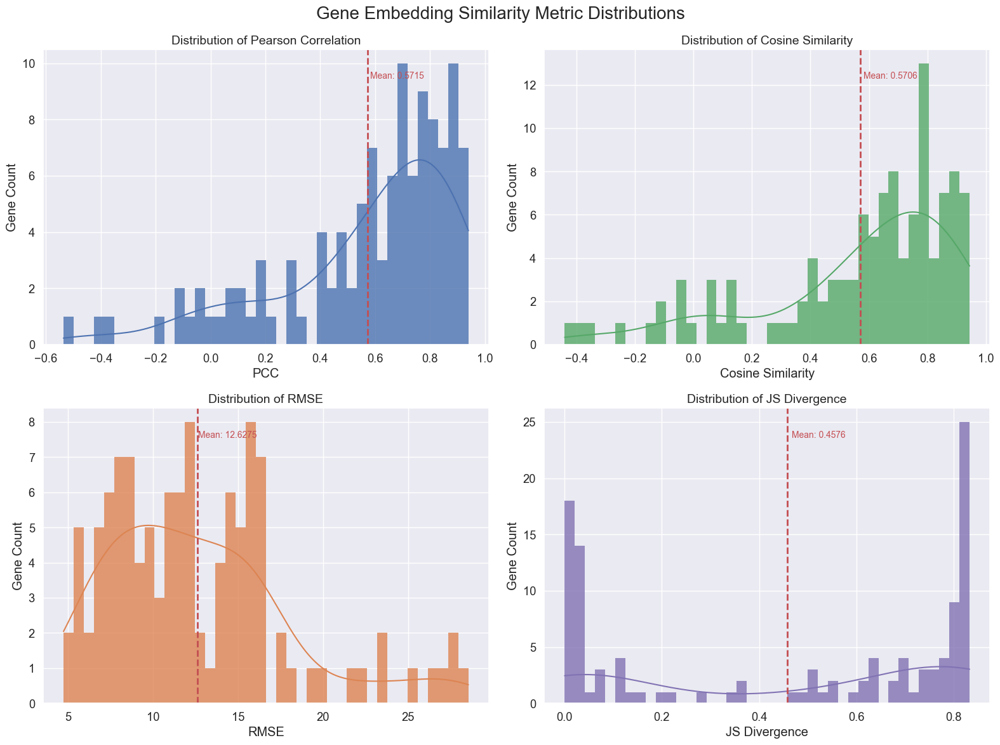


--- Visualization complete ---


In [25]:
from GenOT.plotting import calculate_gene_embedding_metrics, plot_gene_embedding_metrics_distributions
# Calculate various metrics to evaluate the quality of the gene embeddings derived from the imputation.
# These metrics assess how well the imputed gene expression preserves the original's gene-embedding relationships.
df = calculate_gene_embedding_metrics(adata3, mapped_adata, n_pca_components=16)
# Plot the distributions of these calculated gene embedding metrics.
plot_gene_embedding_metrics_distributions(df)